## Import the libraries

In [2]:
import os
import sys

import matplotlib.pyplot as plt
import pandas as pd


PROJECT_PATH = '../'
print(PROJECT_PATH)
DATASET_DIR = os.path.join(PROJECT_PATH, 'test')

sys.path.append(PROJECT_PATH)

from nima.config import INPUT_SHAPE, print_msg, CROP_SHAPE
from nima.model.data_generator import TestDataGenerator
from nima.model.model_builder import TechnicalModel
from nima.utils.image_utils import get_images
from nima.evaluate.predict import get_technical_predictions, get_aesthetic_prediction


../


In [21]:
# Initialize values
p_model_name = 'mobilenet_v2'
p_dataset_dir = DATASET_DIR

tech_weight_file = os.path.join(PROJECT_PATH, 'weights', 'technical', 'weights-mobilenetv2-technical.hdf5')
tech_weight_file = os.path.join(PROJECT_PATH, 'weights', 'technical', 'MobileNetV2_technical.hdf5')


aes_weight_file = os.path.join(PROJECT_PATH, 'weights', 'aesthetic', 'weights_mobilenet_aesthetic_0.07.hdf5')


In [22]:
assert os.path.isfile(aes_weight_file), f"Invalid weights file {aes_weight_file}"
assert os.path.isfile(tech_weight_file), f"Invalid weights file {tech_weight_file}"

assert os.path.isdir(p_dataset_dir), f"Invalid Images directory : {p_dataset_dir}"
print_msg(f'Images directory {p_dataset_dir}')

# Check the images present in the given directory
images = get_images(p_dataset_dir)
images = [os.path.basename(file).replace('.jpg', '') for file in images]  # remove path from filename

# Load the test dataframe if not passed
assert len(images) > 0, 'Empty directory, no images found.'

x_col, y_cols = 'image_id', 'mean'
test_df = pd.DataFrame(images, columns=['image_id'])
test_df['image_id'] = test_df['image_id'].astype('int')

test_df.head()


Images directory ../test


,image_id
0,1
1,10
2,11
3,12
4,13


In [23]:
tech_predict_df = get_technical_predictions(p_model_name=p_model_name, p_dataset_dir=p_dataset_dir,
                                            p_weight_file=tech_weight_file, df=test_df.copy())

tech_predict_df.head()

Technical Model ....
	Base CNN module - tensorflow.keras.applications.mobilenet_v2.MobileNetV2


ValueError: Cannot assign to variable dense_2/kernel:0 due to variable shape (1280, 1000) and value shape (1280, 128) are incompatible

In [32]:
from keras.applications.mobilenet_v2 import MobileNetV2
from keras.models import Model
from keras.layers import Dropout, Dense
# from keras.optimizers import Adam

mobilenet = MobileNetV2(input_shape=(224,224,3), weights=None, pooling='avg', include_top=False)
x = Dropout(0.75)(mobilenet.output)
x = Dense(10)(x)
model = Model(mobilenet.input, outputs=x)

# model.compile(optimizer=Adam(), loss='mse', metrics='mae')
# model.summary()

len(model.layers), mobilenet.output

(157,
 <KerasTensor: shape=(None, 1280) dtype=float32 (created by layer 'global_average_pooling2d_10')>,
 <KerasTensor: shape=(None, 1280) dtype=float32 (created by layer 'global_average_pooling2d_10')>)

In [27]:
aes_predict_df = get_aesthetic_prediction(p_model_name='mobilenet_v2', p_dataset_dir=p_dataset_dir,
                                          p_weight_file=aes_weight_file,  df=test_df)

aes_predict_df

Aesthetic Model ....
aesthetic
	Base CNN module - tensorflow.keras.applications.mobilenet_v2.MobileNetV2


ValueError: You are trying to load a weight file containing 55 layers into a model with 105 layers.

In [5]:
predict_df = pd.merge(tech_predict_df, aes_predict_df, on='image_id')
predict_df

NameError: name 'nima_tech_cnn' is not defined

In [ ]:
show_images_with_score(predict_df, images_dir)

Rows : 8 | Columns : 5


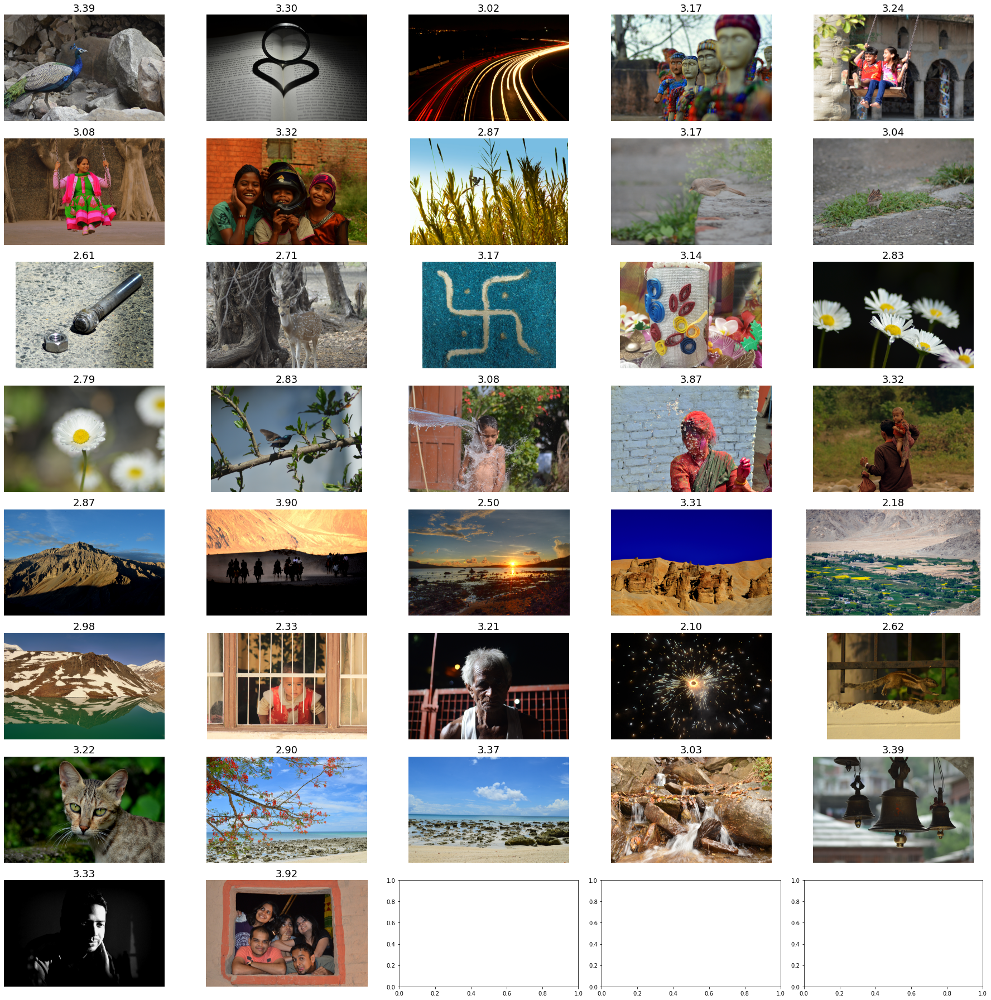

In [50]:
def show_images_with_mean(df, img_dir, sort_by_score=True):
    """
    Print the 10 images with prediction score and actual mean score
    :param df: dataframe having predictions score.
    :param img_dir: Image directory.
    """
    import math
    from PIL import Image

    df = df.sort
    num_images = df.shape[0]
    n_col, n_row = 5, math.ceil(num_images / 5)

    print(f"Rows : {n_row} | Columns : {n_col}")
    fig, axes = plt.subplots(n_row, n_col, figsize=(n_row * 5, 25))
    # Loop for number of images
    fig.suptitle('Technical - Mean score prediction')
    for i in range(num_images):
        row, col = i // 5, i % 5
        ax = axes[row][col]
        ser = df.iloc[i]

        # get the mean score
        img_name = ser['image_id']
        pred_mean = ser['pred_mean']

        img_path = os.path.join(img_dir, f"{img_name}.jpg")
        img = Image.open(img_path)
        ax.set_title(f'{img_name} - {pred_mean:.2f}', size=18, loc='center')
        ax.axis('off')
        ax.imshow(img, aspect='equal')

    plt.tight_layout()


show_images_with_mean(df=test_df, img_dir=p_dataset_dir)

In [4]:
df_test.sort_values(by='pred_mean')

NameError: name 'df_test' is not defined